# Analyzing PBMCs single-cell data with TopOMetry


TopOMetry is intended for the topological analysis and visualization of high-dimensional data. In this notebook, I showcase how it can be used for the analysis of single-cell data, a challenging data modality which has been pushing representation learning to new frontiers. We'll be using a dataset containing around 3,000 individually RNA sequenced cells, consisting of peripherical blood mononuclear cells extracted from a healthy donor. 
To assist us throghout this analysis, we'll be using [scanpy](https://scanpy.readthedocs.io/en/latest/index.html), a scalable toolkit for analyzing single-cell RNA sequencing data. In particular, we'll use the _anndata_ framework for storing single-cell data and its plotting API for some plotting. 

## Install and load libraries

In [1]:
# Install pre-requisites and scanpy (pre-requisites for scanpy are python-igraph and leidenalg)
#!pip3 install nmslib hnswlib scipy scanpy numba kneed pymde python-igraph leidenalg scanpy 

In [2]:
# Install pre-release of TopOMetry
#!pip3 install topometry

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import pymde
import topo as tp

/usr/local/lib/python3.8/dist-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


These are some scanpy helper functions:

In [4]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white')

## Load data and QC

Download data from 10X genomics [website](https://support.10xgenomics.com/single-cell-gene-expression/datasets):

In [5]:
!mkdir data
!wget http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz -O data/pbmc3k_filtered_gene_bc_matrices.tar.gz
!cd data; tar -xzf pbmc3k_filtered_gene_bc_matrices.tar.gz
!mkdir write

mkdir: cannot create directory ‘data’: File exists
--2021-05-25 20:39:16--  http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 2606:4700::6812:ad, 2606:4700::6812:1ad, 104.18.0.173, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|2606:4700::6812:ad|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz [following]
--2021-05-25 20:39:16--  https://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|2606:4700::6812:ad|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7621991 (7.3M) [application/x-tar]
Saving to: ‘data/pbmc3k_filtered_gene_bc_matrices.tar.gz’

data/pbmc3k_filtere 100%[===================>]   7.27M  33.0MB/s    in 0.2s    



In [6]:
results_file = 'write/pbmc10k.h5ad'  # the file that will store the analysis results

Read in the data with Scanpy:

In [7]:
adata = sc.read_10x_mtx(
    'data/filtered_gene_bc_matrices/hg19/',  
    var_names='gene_symbols',                
    cache=True)                                     
adata.var_names_make_unique()
adata                            

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

This data contains 6,437 cells with 36,601 sequenced genes each. A great deal of this is just experimental noise, so we need to perform some quality control. Here, we'll do the default quality-control analysis:

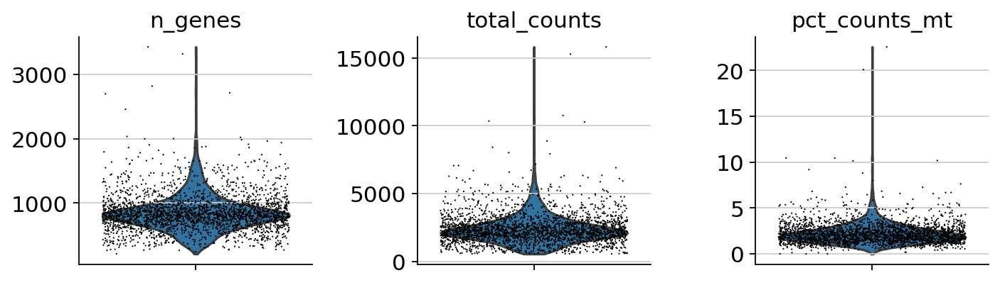

In [8]:
# Default QC
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Actually perform some filtering:

In [9]:
adata = adata[adata.obs.n_genes < 2000, :]
adata = adata[adata.obs.total_counts < 5000, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]
adata

View of AnnData object with n_obs × n_vars = 2574 × 13714
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

## Default Scanpy workflow (PCA-based)

Here, for brevity sake, we'll perform the default scanpy workflow. For more information about the analysis of single-cell data and proposed workflows, we direct the interested user to [Scanpy tutorials](https://scanpy-tutorials.readthedocs.io/en/latest/index.html) and this [excellent best-practices review](https://www.embopress.org/doi/full/10.15252/msb.20188746). 

In short, this involves normalizing the library size of each sequenced cell by the total number of detected mRNA molecules, then logarithmizing it. Next, genes with high expression mean and high dispersion are selected as highly-variable genes, and stored for downstream analysis. Data is then scaled and mean-centered. 

The default workflow further involves computing PCA, and then using top principal components to compute a neighborhood graph. From this graph, it is possible to cluster cells with the leiden algorithm, and to obtain lower-dimensional embeddings with UMAP.

In [10]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=8, min_disp=0.3)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

/home/davi/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/davi/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Let's visualize how the PCA-based UMAP looks like. We'll also look at some marker genes (CD3E for T cells, LYZ for monocytes, MS4A1 for B cells and PPBP for platlets)

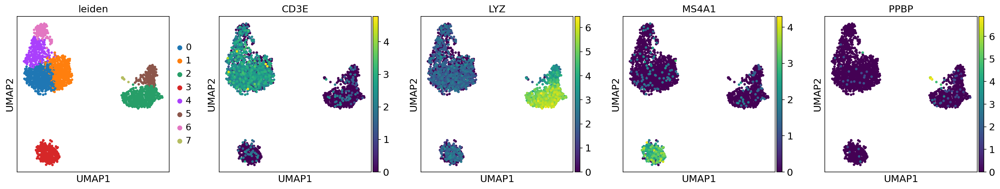

In [11]:
sc.pl.embedding(adata, basis='umap', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=50, ncols=5)

This looks neat. Let's see how it compares to the TopOMetry workflow.

## Topological analysis with TopOMetry

Now that we have concluded the default Scanpy analysis, let's perform some topological analyses with TopOMetry. For this, we will start up a TopOGraph object with some data, and populate its slots as we proceed with the analysis. These 4 steps will be followed:

* Learn topological metrics - this can be done with three different models:
    ** diffusion harmonics (default);
    ** continuous k-nearest-neighbors (ckNN);
    ** fuzzy simplicial sets;
* Build a topological basis - this can be done with multiscale diffusion maps or a Laplacian Eigenmap of the continuous of fuzzy metrics
* Extract a topological graph - again, this can be done with any of the three above models
* Optimize a topological layout - this can be done with:
    ** a Minimum Distortion Embedding or; 
    ** a Manifold Approximation and Projection (an UMAP adaptation)

For now, let's start with the default TopOMetry analysis - using diffusion harmonics, multiscale maps and graphs.

### Fit a topological basis

In [12]:
# Start up the TopOGraph
tg = tp.models.TopOGraph(n_jobs=12,
                         verbose=True,
                         plot_spectrum=True)
tg

TopoGraph object without any fitted data. 
 Active basis: diffusion basis. 
 Active graph: diff graph.

Building topological basis...
Diffusion time = 11.359839 (sec), per sample=0.004413 (sec), per sample adjusted for thread number=0.052960 (sec)
Multiscaled a maximum of 40 computed diffusion components.
Multiscale decomposition time = 0.885871 (sec), per sample=0.000344 (sec), per sample adjusted for thread number=0.004130 (sec)


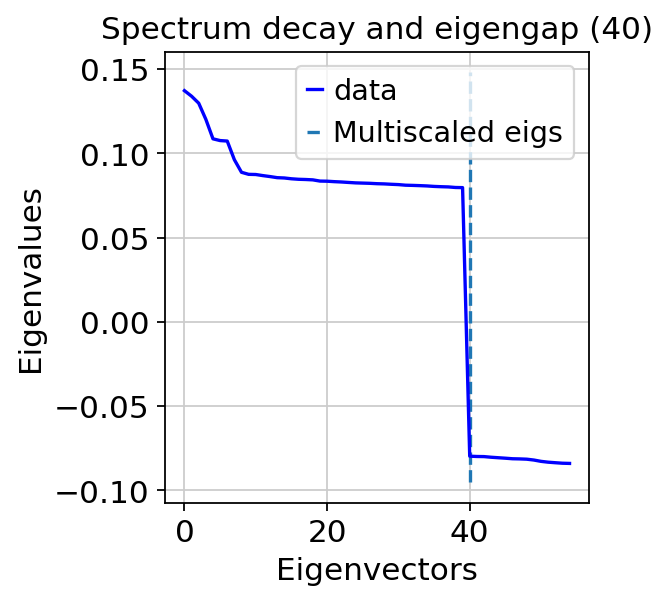

Topological basis fitted with diffusion mappings in 12.459218 (sec)


TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
 Active basis: diffusion basis. 
 Active graph: diff graph.

In [13]:
# fit the TopOGraph model on the HVG matrix
tg.fit(adata.X) 

When building multiscale diffusion maps, TopOMetry allows the user to visualize the dataset diffusion eigenspectrum. It automatically estimates the dataset dimensionality (related to the maximum real-valued eigenvalues) and selects and adequate number of diffusion components to scale and store for downstream analysis at `TopoGraph.MSDiffMap`. 

Users are also allowed to rescale the diffusion components to another number of components, if they want to obtain less or further detail on their dataset. As rule of thumb, more components lead to more detailed analyses, but can result in very disconnected embeddings. 

In [14]:
# Add the multiscale diffusion maps to adata as a lower-dimensional representation
adata.obsm['X_msdiffmap'] = tg.MSDiffMap

## Fit the topological graph


Let's take a look at our `TopOGraph` object:

In [15]:
tg

TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
 Active basis: diffusion basis. 
 Active graph: diff graph.


After learning a topological basis, extracting an associated topological graph from the active basis is as simple as running `TopOGraph.transform()`. Note that the graph will be computed as per the `TopOGraph.graph` parameter (default `diff`, diffusion harmonics), on the specified `TopOGraph.basis` parameter (the active basis). 

In [16]:
db_diff_graph = tg.transform()

Building topological graph...
Diffusion time = 0.082319 (sec), per sample=0.000032 (sec), per sample adjusted for thread number=0.000384 (sec)
Topological graph extracted in = 0.082530 (sec)


## Learn a topological spectral layout

Now that we have learned a topological graph from our topological basis, we can visualize it in two or three dimensions with an spectral embedding. This essentially involves computing a multi-component Laplacian Eigenmap:

Running fast approximate nearest neighbors with NMSLIB using HNSW...
Index-time parameters M: 2259 n_threads: 12 efConstruction: 50 post:0
Indexing time = 4.622523 (sec)
Query-time parameter efSearch: 50
kNN time total=0.177956 (sec), per query=0.000069 (sec), per query adjusted for thread number=0.000830 (sec)


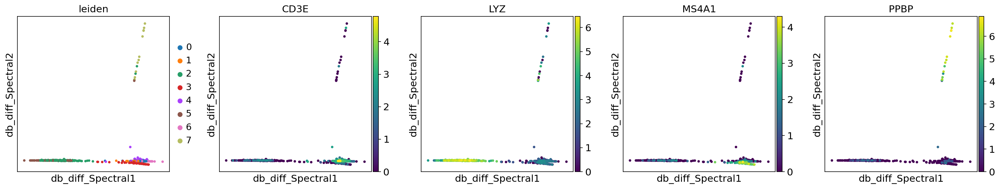

In [17]:
db_diff_spec_emb = tg.spectral_layout()

# Add learned embedding to adata
adata.obsm['X_db_diff_Spectral'] = db_diff_spec_emb

sc.pl.embedding(adata, basis='db_diff_Spectral', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=50, ncols=5)

As one can easily see, this is a rather noisy embedding. It is able to separate platlets (PPBP+), monocytes (LYZ+) and lymphocytes (CD3E/MS4A1), but it is unable to separate T and B lymphocytes. Because this provides good global structure preservation, let's try to use it to initialise a topological embedding optimization.

## Optimize the topological graph layout

Now that we have learned a topological graph and an spectral embedding from our topological basis, we can optimize its layout in order to better visualize it. TopOMetry offers two options for that task:

 * MAP - Manifold Approximation and Projection, a generalized version of UMAP that does not hold the uniform distribution assumption. It's goal is to minimize the divergence between a given basis and a topological graph.
 * MDE - Minimum Distortion Embedding, a recently proposed dimensionality reduction method that generalized the problem of effective data visualization through convex optimization.

Naturally, you may perform visualization with any other method, such as t-SNE, PHATE or autoencoders, and still take advantage of TopOMetry by simply using the topological basis as input instead of raw data. Alternatively, if your chosen method takes as input a similarity or adjacency matrix, you can use the topological graph.

First, we'll perform layout optimization with the MAP approach:

In [18]:
# Minimize divergence between the diffusion basis and diffusion graph
emb_db_diff_map, aux = tg.MAP(init=db_diff_spec_emb) # by default computes a spectral initialisation

# Add learned embedding to adata
adata.obsm['X_db_diff_MAP'] = emb_db_diff_map

Fuzzy layout optimization embedding in = 2.981363 (sec)


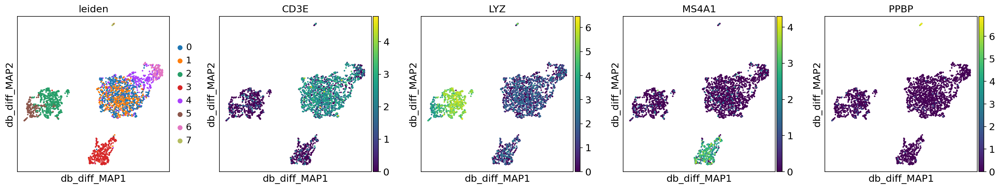

In [19]:
sc.pl.embedding(adata, basis='db_diff_MAP', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

This looks much better! Now our embedding clearly separates T and B lymphocytes, as well as other cell types (platlets and monocytes).

Next, we'll perform the layout optimization with pyMDE. This involves setting up an MDE problem, and effectively optimizing the embedding from a given initialization.

TopOMetry has pyMDE functions built-in in the `topo.lt` module. A separate tutorial exploring the wide array of options involved in MDE optimization is in the making. 

For now, let's run MDE with the default parameters:

In [20]:
# Layout optimization with Minimum Distortion Embedding


# Set up MDE problem
db_diff_mde = tg.MDE()

# Use the spectral initialisation; it needs to be a pytorch tensor:
import torch
init = torch.tensor(db_diff_spec_emb)

# Solve the MDE problem
db_diff_emb = db_diff_mde.embed(X=init, verbose=False)

# Add to adata
adata.obsm['X_db_diff_MDE'] = db_diff_emb

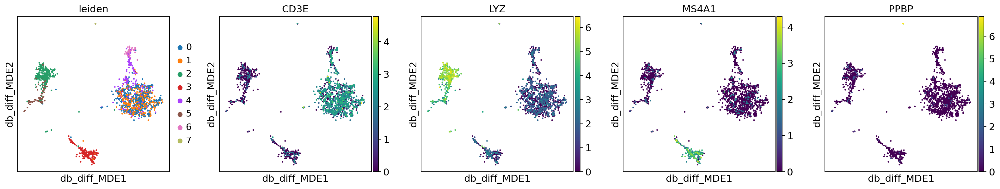

In [21]:
# Plot with scanpy
sc.pl.embedding(adata, basis='db_diff_MDE', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

TopOMetry's pyMDE backend also allows us to visualize how data looks like during the optimization process:

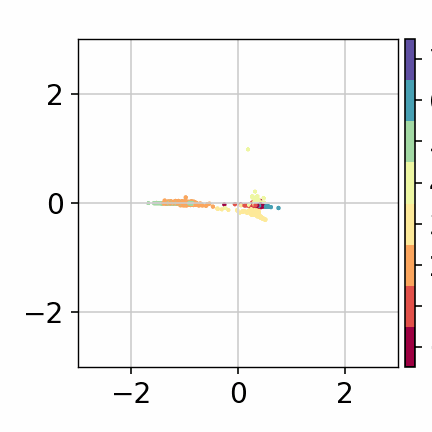

In [22]:
db_diff_emb = db_diff_mde.embed(X=init, verbose=False, snapshot_every=5)

# Explore how data behaves during optimization
db_diff_mde.play(savepath='pbmc3k_db_diff_MDE.gif',
                 marker_size=5, 
                 color_by=adata.obs['leiden'],
                 figsize_inches=(3,3),
                axis_limits=[-3, 3])

Let's now see what we have got inside the `tg` object storing our TopOGraph:

In [23]:
tg

TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
    Diffusion graph fitted - .DiffGraph 
    Fuzzy graph fitted - .FuzzyGraph 
    Manifold Approximation and Projection fitted - .fitted_MAP 
    Minimum Distortion Embedding set up - .MDE_problem 
    Spectral layout fitted - .SpecLayout 
 Active basis: diffusion basis. 
 Active graph: diff graph.

### Exploring alternative topologies with TopOMetry

Now that we have explored some of data topology with the default TopOMetry analysis, we can also explore it under continuous nearest-neighbors topologies. We will explore the following, straightforwards combinations:

1 - Diffusion basis, diffusion graph (default, as we did above)

2 - Continuous basis, cknn graph

3 - Fuzzy basis, fuzzy graph

Although all these models render similar results, they give you, the end user, flexibility to find the better suited combination for your data. From our experience, these combinations tend to have more robust and significative results throghout various datasets, but you have a choice :)

Let's now try combination (2). For that, we can reuse our TopOGraph object, and change its default basis and graph model and fit the model once again. The previously computed diffusion basis and graph are not lost in this process. 

In [24]:
tg.basis = 'continuous'
tg.graph = 'cknn'
tg.fit(adata.X)

Building topological basis...


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Topological basis fitted with continuous mappings in 4.218035 (sec)


TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Continuous basis fitted - .ContBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
    Continuous Laplacian Eigenmaps fitted - .CLapMap 
    Diffusion graph fitted - .DiffGraph 
    Fuzzy graph fitted - .FuzzyGraph 
    Manifold Approximation and Projection fitted - .fitted_MAP 
    Minimum Distortion Embedding set up - .MDE_problem 
    Spectral layout fitted - .SpecLayout 
 Active basis: continuous basis. 
 Active graph: cknn graph.

Once again, we use the topological basis to compute a topological graph:

In [25]:
cb_cknn_graph = tg.transform()

Building topological graph...
Topological graph extracted in = 0.207991 (sec)


/usr/local/lib/python3.8/dist-packages/topo/tpgraph/cknn.py:210: RuntimeWarning: divide by zero encountered in true_divide
  ratio_matrix = dmatrix / np.sqrt(darray_n_nbrs.dot(darray_n_nbrs.T))
/usr/local/lib/python3.8/dist-packages/topo/tpgraph/cknn.py:210: RuntimeWarning: invalid value encountered in true_divide
  ratio_matrix = dmatrix / np.sqrt(darray_n_nbrs.dot(darray_n_nbrs.T))
/usr/local/lib/python3.8/dist-packages/topo/tpgraph/cknn.py:216: RuntimeWarning: invalid value encountered in less
  self.A = csr_matrix(ratio_matrix < delta)


Again, let's perform layout optimization with MAP and MDE:

In [26]:
# Minimize divergence between the diffusion basis and diffusion graph
cb_cknn_map, aux = tg.MAP()

# Add learned embedding to adata
adata.obsm['X_cb_cknn_MAP'] = cb_cknn_map

Fuzzy layout optimization embedding in = 4.633055 (sec)


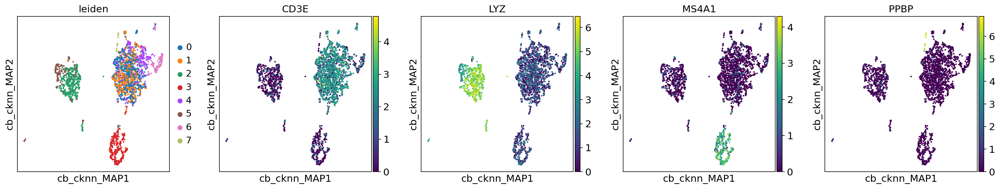

In [27]:
sc.pl.embedding(adata, basis='cb_cknn_MAP', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

In [28]:
# Set up MDE problem
cb_cknn_mde = tg.MDE()
cb_cknn_emb = cb_cknn_mde.embed(X=init, verbose=False, snapshot_every=5)

# Add to adata
adata.obsm['X_cb_cknn_MDE'] = cb_cknn_emb

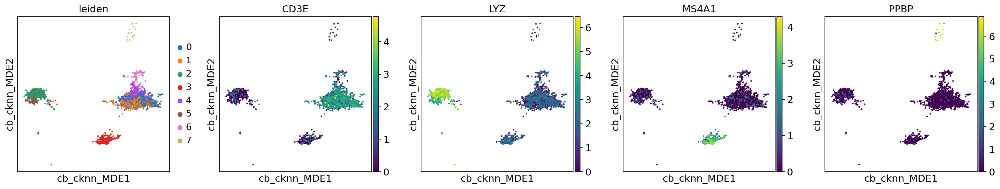

In [29]:
# Plot with scanpy
sc.pl.embedding(adata, basis='cb_cknn_MDE', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

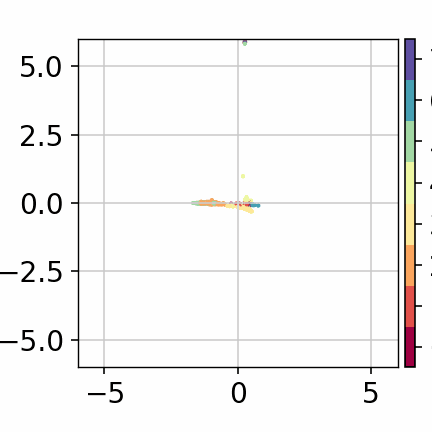

In [30]:
# Explore how data behaves during optimization
cb_cknn_mde.play(savepath='pbmc3k_cb_cknn_MDE.gif',
                 marker_size=5, 
                 color_by=adata.obs['leiden'],
                 figsize_inches=(3,3),
                axis_limits=[-6, 6])

As we can see, we still get more or less the same clusters distribution.

Now, let's explore how a fuzzy model looks like. 

In [31]:
tg.basis = 'fuzzy'
tg.graph = 'fuzzy'
tg.fit(adata.X)

Building topological basis...
Running fast approximate nearest neighbors with NMSLIB using HNSW...
Index-time parameters M: 2259 n_threads: 12 efConstruction: 50 post:0
Indexing time = 5.593261 (sec)
Query-time parameter efSearch: 50
kNN time total=0.607913 (sec), per query=0.000236 (sec), per query adjusted for thread number=0.002834 (sec)
Topological basis fitted with fuzzy mappings in 9.581882 (sec)


TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Continuous basis fitted - .ContBasis 
    Fuzzy basis fitted - .FuzzyBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
    Continuous Laplacian Eigenmaps fitted - .CLapMap 
    Fuzzy Laplacian Eigenmaps fitted - .FuzzyLapMap 
    Diffusion graph fitted - .DiffGraph 
    Continuous graph fitted - .CknnGraph 
    Fuzzy graph fitted - .FuzzyGraph 
    Manifold Approximation and Projection fitted - .fitted_MAP 
    Minimum Distortion Embedding set up - .MDE_problem 
    Spectral layout fitted - .SpecLayout 
 Active basis: fuzzy basis. 
 Active graph: fuzzy graph.

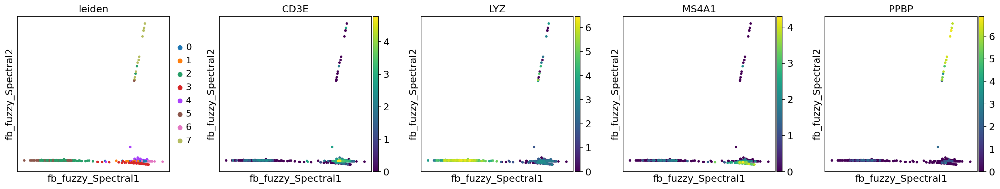

In [32]:
fb_fuzzy_spec_emb = tg.spectral_layout()

# Add learned embedding to adata
adata.obsm['X_fb_fuzzy_Spectral'] = fb_fuzzy_spec_emb

sc.pl.embedding(adata, basis='fb_fuzzy_Spectral', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=50, ncols=5)

In [33]:
# Minimize divergence between the diffusion basis and diffusion graph
fb_fuzzy_map, aux = tg.MAP()

# Add learned embedding to adata
adata.obsm['X_fb_fuzzy_MAP'] = fb_fuzzy_map

Fuzzy layout optimization embedding in = 3.805161 (sec)


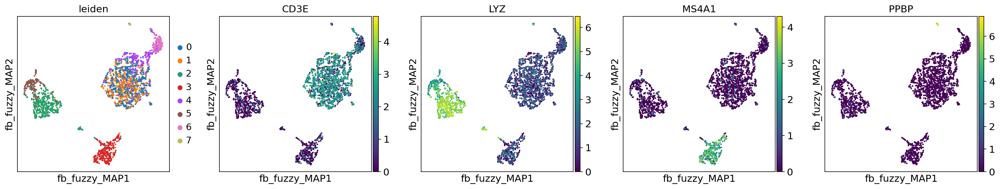

In [34]:
sc.pl.embedding(adata, basis='fb_fuzzy_MAP', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

In [35]:
# Set up MDE problem
fb_fuzzy_mde = tg.MDE()
fb_fuzzy_emb = fb_fuzzy_mde.embed(X=init, verbose=False, snapshot_every=5)

# Add to adata
adata.obsm['X_fb_fuzzy_MDE'] = fb_fuzzy_emb

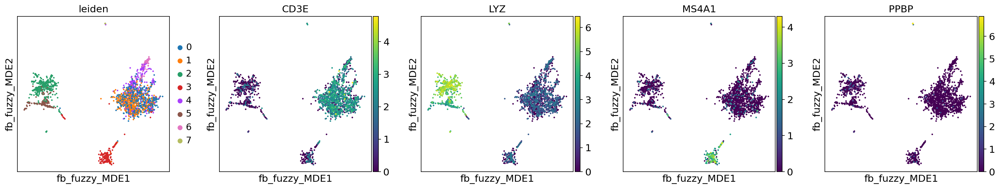

In [36]:
# Plot with scanpy
sc.pl.embedding(adata, basis='fb_fuzzy_MDE', color=['leiden', 'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=5)

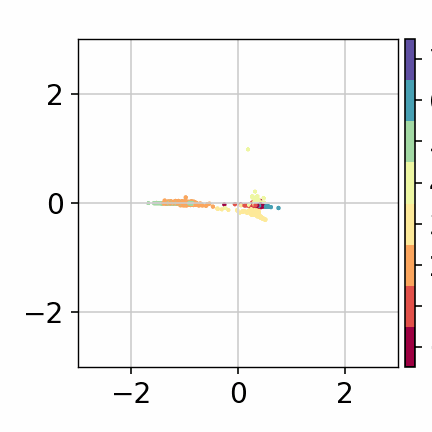

In [37]:
# Explore how data behaves during optimization
fb_fuzzy_mde.play(savepath='pbmc3k_fb_fuzzy_MDE.gif',
                 marker_size=5, 
                 color_by=adata.obs['leiden'],
                 figsize_inches=(3,3),
                axis_limits=[-3, 3])

Now that we have computed our results, let's look how our `tg` TopOGraph looks like!

In [38]:
tg

TopoGraph object with 2574 samples and 2259 observations and: 
    Diffusion basis fitted - .DiffBasis 
    Continuous basis fitted - .ContBasis 
    Fuzzy basis fitted - .FuzzyBasis 
    Multiscale Diffusion Maps fitted - .MSDiffMap 
    Continuous Laplacian Eigenmaps fitted - .CLapMap 
    Fuzzy Laplacian Eigenmaps fitted - .FuzzyLapMap 
    Diffusion graph fitted - .DiffGraph 
    Continuous graph fitted - .CknnGraph 
    Fuzzy graph fitted - .FuzzyGraph 
    Manifold Approximation and Projection fitted - .fitted_MAP 
    Minimum Distortion Embedding set up - .MDE_problem 
    Spectral layout fitted - .SpecLayout 
 Active basis: fuzzy basis. 
 Active graph: fuzzy graph.

## Re-clustering cells without the PCA basis

    Because of the computational expense involved in single-cell analysis, it is common-place for analysis toolkits to perform PCA as a preprocessing step. Neighborhoods (and clusters) are then computed from the PCA basis, which can be misleading when dealing with high-dimensional, non-linear data. 
    Here, we'll show how providing Scanpy with TopOMetry learned metrics can improve its clustering. For demonstration purposes, we'll use scanpy built-in leiden algorithm.
    First, let's add TopOMetry metrics to the `AnnData` object containing our single-cell data.
    

In [39]:
# Store the PCA-derived clusters
adata.obs['pca_leiden'] = adata.obs['leiden']


# Compute clusters with the leiden algorithm using topological basis
sc.tl.leiden(adata, resolution=0.5,
             adjacency=tg.DiffGraph, 
             key_added='diff_leiden')

sc.tl.leiden(adata, resolution=0.2,
             adjacency=tg.CknnGraph, 
             key_added='cknn_leiden')

sc.tl.leiden(adata, resolution=0.5,
             adjacency=tg.FuzzyGraph, 
             key_added='fuzzy_leiden')

## Comparing the obtained embeddings

Cool! Now let's compare how our embeddings look like, and how the default clustering and some marker genes expressions are distributed. First, let's look at the MAP embeddings:

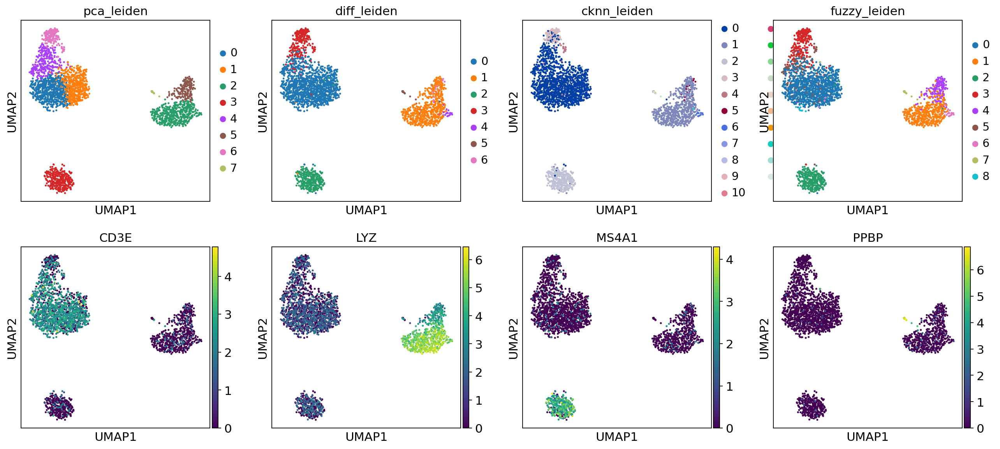

In [40]:
sc.pl.embedding(adata, basis='umap', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

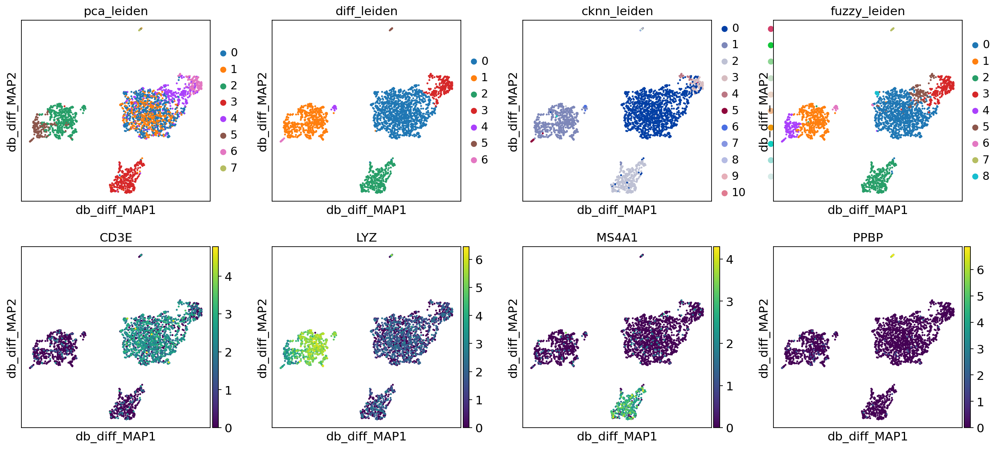

In [41]:
sc.pl.embedding(adata, basis='db_diff_MAP', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

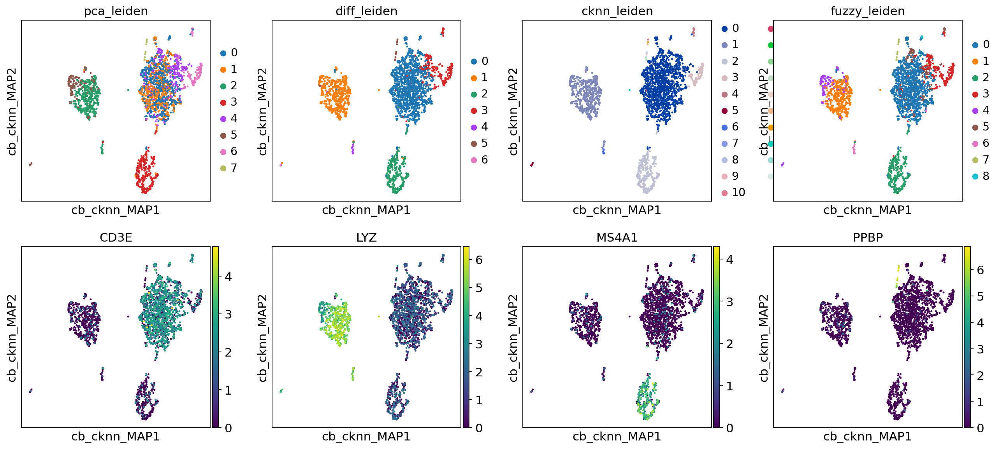

In [42]:
sc.pl.embedding(adata, basis='cb_cknn_MAP', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

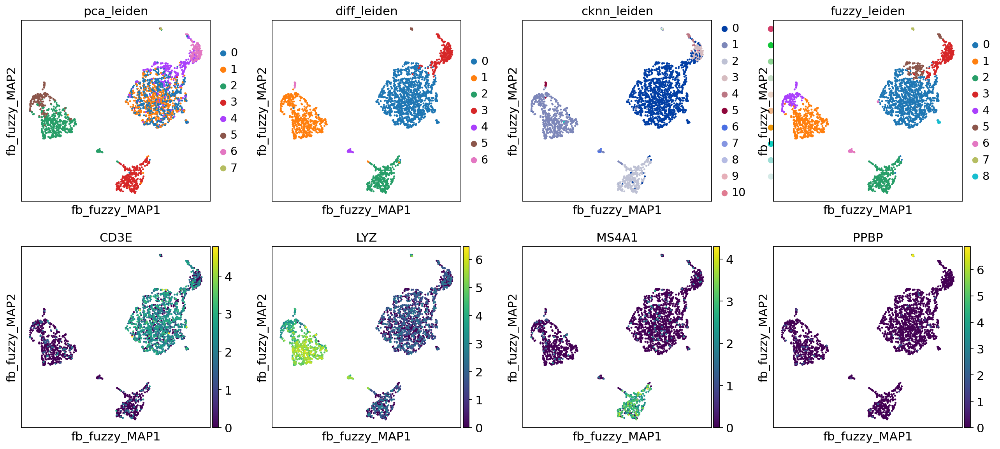

In [43]:
sc.pl.embedding(adata, basis='fb_fuzzy_MAP', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

Next, at the MDE embeddings:

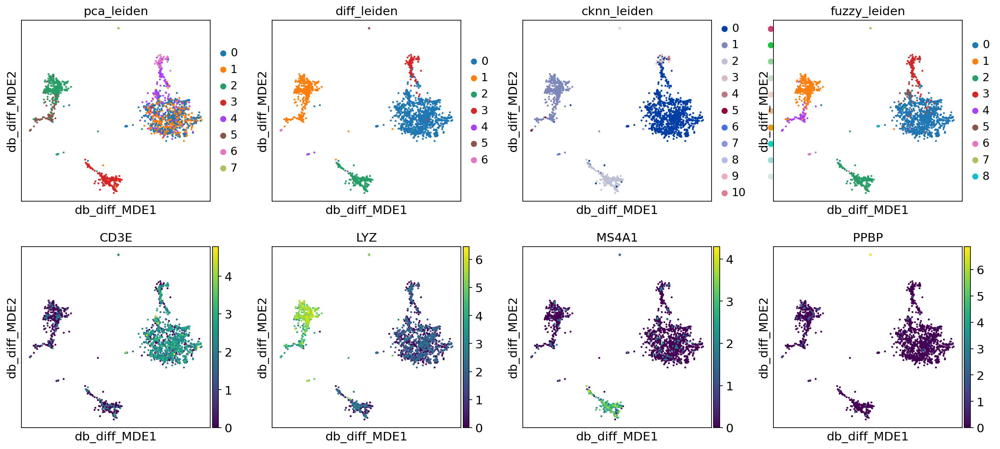

In [44]:
sc.pl.embedding(adata, basis='db_diff_MDE', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

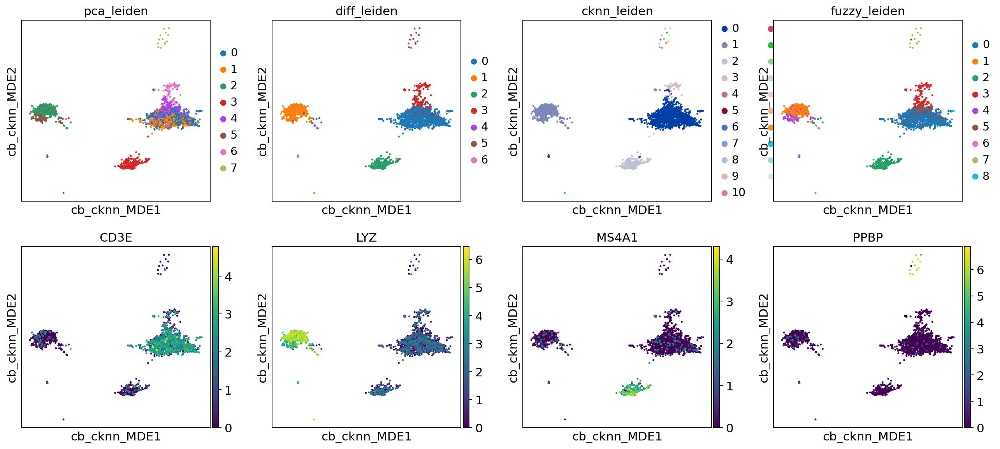

In [45]:
sc.pl.embedding(adata, basis='cb_cknn_MDE', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

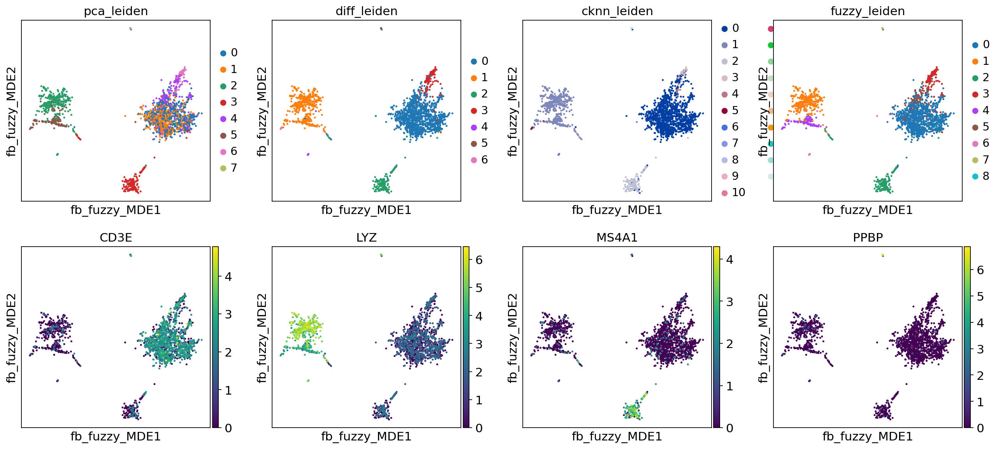

In [46]:
sc.pl.embedding(adata, basis='fb_fuzzy_MDE', color=['pca_leiden', 'diff_leiden', 'cknn_leiden', 'fuzzy_leiden',
                                                   'CD3E', 'LYZ', 'MS4A1', 'PPBP'], size=20, ncols=4)

That's it for this tutorial! I hope you enjoyed and that TopOMetry might be useful for you!